In [1]:
from utils import clean_text, extract_and_clean_pages_from_pdf, store_phrases_in_chromadb, build_knowledge_graph, generate_node_embeddings, visualize_knowledge_graph
import chromadb
from sentence_transformers import SentenceTransformer
from langchain.schema import HumanMessage
from langchain_community.chat_models import ChatOllama
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import display, HTML



In [2]:
pdf_path = 'practice-standard-project-risk-management.pdf'
pages = extract_and_clean_pages_from_pdf(pdf_path)

# Cell 3: Extract Specific Chapters and Appendices
chapter_ranges = {
    "Chapter 1": (13, 19),
    "Chapter 2": (21, 24),
    "Chapter 3": (25, 29),
    "Chapter 4": (31, 35),
    "Chapter 5": (37, 41),
    "Chapter 6": (43, 47),
    "Chapter 7": (49, 54),
    "Chapter 8": (55, 62),
    "Chapter 9": (63, 67),
    "Appendix A": (69, 69),
    "Appendix B": (71, 72),
    "Appendix C": (73, 79),
    "Appendix D": (81, 117)
}

In [3]:
phrases = []
page_metadata = []

for chapter, (start_page, end_page) in chapter_ranges.items():
    for page_number, page_text in pages:
        if start_page <= page_number <= end_page:
            page_phrases = page_text.split('.')  # Split by sentences
            page_phrases = [phrase.strip() for phrase in page_phrases if phrase.strip()]
            phrases.extend(page_phrases)
            page_metadata.extend([{"page": page_number, "chapter": chapter}] * len(page_phrases))

In [4]:
collection_name = "pdf_phrases_collection"
collection, model = store_phrases_in_chromadb(phrases, page_metadata, collection_name)

print(f"Saved {len(phrases)} phrases to Chroma DB.")

Saved 1685 phrases to Chroma DB.


In [5]:
entities_file = 'nodes_relation_frequency/nodes.csv'
relationships_file = 'nodes_relation_frequency/relationships.csv'
knowledge_graph, entities_df, relationships_df = build_knowledge_graph(entities_file, relationships_file)

print("Knowledge Graph constructed with nodes and relationships.")

Knowledge Graph constructed with nodes and relationships.


In [6]:
node_embeddings = generate_node_embeddings(knowledge_graph)
print("Node embeddings generated.")


Computing transition probabilities:   0%|          | 0/851 [00:00<?, ?it/s]

Node embeddings generated.


In [7]:
local_model = "llama3:8b"
llm = ChatOllama(model=local_model)

C:\Users\msalm\AppData\Local\Temp\ipykernel_23040\402184239.py:2: LangChainDeprecationWarning: The class `ChatOllama` was deprecated in LangChain 0.3.1 and will be removed in 1.0.0. An updated version of the class exists in the :class:`~langchain-ollama package and should be used instead. To use it run `pip install -U :class:`~langchain-ollama` and import as `from :class:`~langchain_ollama import ChatOllama``.
  llm = ChatOllama(model=local_model)


# GraphRAG

In [33]:
def graph_rag_response(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()

    # Step 2: Expand query with Knowledge Graph relationships
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            neighbors = list(knowledge_graph.neighbors(entity))
            relevant_nodes.append(entity)
            for neighbor in neighbors:
                relation = knowledge_graph[entity][neighbor]['relation']
                expanded_query += f" {relation} {neighbor}"
                expanded_node_embeddings.append(node_embeddings[neighbor])
                relevant_nodes.append(neighbor)

    # Step 3: Retrieve relevant documents and metadata from Chroma DB
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    # Step 4: Calculate semantic similarity between the query and retrieved chunks
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    context = " ".join(retrieved_chunks)

    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]

    response = llm.generate(messages=[messages])

    if not response or not hasattr(response, 'generations') or len(response.generations[0][0].text.strip()) == 0:
        response_text = "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain."
        return response_text, None, None, None
    else:
        response_text = response.generations[0][0].text

    return response_text, retrieved_chunks, retrieved_metadata, relevant_nodes


In [ ]:
# Cell 9: Ask Questions in a Loop and Display the Response
while True:
    user_query = input("Please enter your question (or type 'exit' to quit): ")
    if user_query.lower() == 'exit':
        print("Exiting... Thank you for using the system!")
        break
    print("\n---\n")
    print(f"User Question: {user_query}")
    print("Generating answer, please wait...\n")
    response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(user_query)

    if retrieved_chunks is None:
        print(f"Model Response: {response}")
    else:
        # Notify that the answer has been generated
        print("Answer generated successfully!\n")
        # Replace \n with <br> to ensure line breaks are respected in HTML output
        model_response = response.replace("\n", "<br>")

        # Display the model response
        display(HTML("<div style='font-weight: bold;'>Model Response:</div>"))
        display(HTML(f"<div>{model_response}</div>"))

        # Display related chunks and page information in a table
        display(HTML("<div style='font-weight: bold; margin-top: 20px;'>Related Chunks and Page Information:</div>"))
        table_html = """
        <table border="1" style="border-collapse: collapse; width: 100%; margin-top: 10px;">
            <thead>
                <tr>
                    <th style="padding: 8px; text-align: left;">Chunk</th>
                    <th style="padding: 8px; text-align: left;">Page</th>
                    <th style="padding: 8px; text-align: left;">Chapter</th>
                </tr>
            </thead>
            <tbody>
        """

        for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
            chunk = chunk.replace("\n", "<br>")
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
            table_html += f"""
                <tr>
                    <td style="padding: 8px; text-align: left;">{chunk}</td>
                    <td style="padding: 8px;">{page}</td>
                    <td style="padding: 8px;">{chapter}</td>
                </tr>
            """

        table_html += """
            </tbody>
        </table>
        """

        display(HTML(table_html))

        # Display only the first 10 relevant nodes used in the response generation
        display(HTML("<div style='font-weight: bold; margin-top: 20px;'>Relevant Nodes:</div>"))
        for node in relevant_nodes[:10]:
            display(HTML(f"<div>- {node}</div>"))
    print("\n---\n")


---

User Question: who is superman
Generating answer, please wait...

Model Response: I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.

---


---

User Question: explain the plan to risk mangement
Generating answer, please wait...

Answer generated successfully!



Chunk,Page,Chapter
"Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES These categories of tools can be used respectively to identify potential responses, select the most appropriate response, translate strategy into planning, and assign the corresponding actions",60,Chapter 8
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES The Plan Risk Responses process determines effective response actions that are appropriate to the priority of the individual risks and to the overall project risk,55,Chapter 8
Practice Standard for Project Risk Management Technique Strengths Weaknesses CSFs for Effective Application Decision Tree Analysis see Chapter 7 Allows calculation of the expected monetary values of various response options as well as the value of the outcomes in the worst case and the best case Delphi Technique see Chapter 5 Involves selected experts in the process Expected Monetary Value EMV see Chapter 7 Provides an estimate of the potential bene t of a risk response Force Field Analysis see Chapter 5 The diagram can suggest where best to apply the responses Industry knowledge base see Chapter 5 Some risks have standard responses Interviews see Chapter 5 Experienced practitioners can provide both new ideas and act as devils advocate for potential responses Nominal Group Technique see Chapter 5 Useful as a creativity technique for generating novel responses Multicriterion selection techniques Provide a means of selecting the responses that best supports the full set of project objectives Can give counter intuitive results Needs an agreed set of weighted project success criteria Postproject reviews Lessons Learned Historical Information see Chapter 5 Leverages previous experience,110,Appendix D
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES 8,57,Chapter 8
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES 8,62,Chapter 8



---


---

User Question: how to do the plan to manage risk
Generating answer, please wait...

Answer generated successfully!



Chunk,Page,Chapter
"Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES These categories of tools can be used respectively to identify potential responses, select the most appropriate response, translate strategy into planning, and assign the corresponding actions",60,Chapter 8
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES The Plan Risk Responses process determines effective response actions that are appropriate to the priority of the individual risks and to the overall project risk,55,Chapter 8
"Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES All the approved, unconditional actions arising from risk response planning should be integrated into the project management plan in order to ensure that they are carried out as part of normal project implementation",56,Chapter 8
Practice Standard for Project Risk Management Technique Strengths Weaknesses CSFs for Effective Application Decision Tree Analysis see Chapter 7 Allows calculation of the expected monetary values of various response options as well as the value of the outcomes in the worst case and the best case Delphi Technique see Chapter 5 Involves selected experts in the process Expected Monetary Value EMV see Chapter 7 Provides an estimate of the potential bene t of a risk response Force Field Analysis see Chapter 5 The diagram can suggest where best to apply the responses Industry knowledge base see Chapter 5 Some risks have standard responses Interviews see Chapter 5 Experienced practitioners can provide both new ideas and act as devils advocate for potential responses Nominal Group Technique see Chapter 5 Useful as a creativity technique for generating novel responses Multicriterion selection techniques Provide a means of selecting the responses that best supports the full set of project objectives Can give counter intuitive results Needs an agreed set of weighted project success criteria Postproject reviews Lessons Learned Historical Information see Chapter 5 Leverages previous experience,110,Appendix D
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES 8,62,Chapter 8



---


---

User Question: what is the chatGPT
Generating answer, please wait...

Model Response: I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.

---

Exiting... Thank you for using the system!


In [34]:
# Cell 9: Ask Questions in a Loop and Display the Response
while True:
    user_query = input("Please enter your question (or type 'exit' to quit): ")
    if user_query.lower() == 'exit':
        print("Exiting... Thank you for using the system!")
        break
    print("\n---\n")
    print(f"User Question: {user_query}")
    print("Generating answer, please wait...\n")
    response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(user_query)

    if retrieved_chunks is None:
        print(f"Model Response: {response}")
    else:
        # Notify that the answer has been generated
        print("Answer generated successfully!\n")
        # Replace \n with <br> to ensure line breaks are respected in HTML output
        model_response = response.replace("\n", "<br>")

        # Display the model response
        display(HTML("<div style='font-weight: bold;'>Model Response:</div>"))
        display(HTML(f"<div>{model_response}</div>"))

        # Display related chunks and page information in a table
        display(HTML("<div style='font-weight: bold; margin-top: 20px;'>Related Chunks and Page Information:</div>"))
        table_html = """
        <table border="1" style="border-collapse: collapse; width: 100%; margin-top: 10px;">
            <thead>
                <tr>
                    <th style="padding: 8px; text-align: left;">Chunk</th>
                    <th style="padding: 8px; text-align: left;">Page</th>
                    <th style="padding: 8px; text-align: left;">Chapter</th>
                </tr>
            </thead>
            <tbody>
        """

        for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
            chunk = chunk.replace("\n", "<br>")
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
            table_html += f"""
                <tr>
                    <td style="padding: 8px; text-align: left;">{chunk}</td>
                    <td style="padding: 8px;">{page}</td>
                    <td style="padding: 8px;">{chapter}</td>
                </tr>
            """

        table_html += """
            </tbody>
        </table>
        """

        display(HTML(table_html))

        # Display only the first 10 relevant nodes used in the response generation
        display(HTML("<div style='font-weight: bold; margin-top: 20px;'>Relevant Nodes:</div>"))
        for node in relevant_nodes[:10]:
            display(HTML(f"<div>- {node}</div>"))
    print("\n---\n")


---

User Question: explain the plan to risk mangement
Generating answer, please wait...



ConnectionError: HTTPConnectionPool(host='localhost', port=11434): Max retries exceeded with url: /api/chat (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x0000013C002C5790>: Failed to establish a new connection: [WinError 10061] Aucune connexion n’a pu être établie car l’ordinateur cible l’a expressément refusée'))

In [ ]:
# Cell 9: Ask Questions in a Loop and Display the Response
while True:
    user_query = input("Please enter your question (or type 'exit' to quit): ")
    if user_query.lower() == 'exit':
        print("Exiting... Thank you for using the system!")
        break
    print("\n---\n")
    print(f"User Question: {user_query}")
    print("Generating answer, please wait...\n")
    response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(user_query)

    if retrieved_chunks is None:
        print(f"Model Response: {response}")
    else:
        # Notify that the answer has been generated
        print("Answer generated successfully!\n")
        # Replace \n with <br> to ensure line breaks are respected in HTML output
        model_response = response.replace("\n", "<br>")

        # Display the model response
        display(HTML("<div style='font-weight: bold;'>Model Response:</div>"))
        display(HTML(f"<div>{model_response}</div>"))

        # Display related chunks and page information in a table
        display(HTML("<div style='font-weight: bold; margin-top: 20px;'>Related Chunks and Page Information:</div>"))
        table_html = """
        <table border="1" style="border-collapse: collapse; width: 100%; margin-top: 10px;">
            <thead>
                <tr>
                    <th style="padding: 8px; text-align: left;">Chunk</th>
                    <th style="padding: 8px; text-align: left;">Page</th>
                    <th style="padding: 8px; text-align: left;">Chapter</th>
                </tr>
            </thead>
            <tbody>
        """

        for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
            chunk = chunk.replace("\n", "<br>")
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
            table_html += f"""
                <tr>
                    <td style="padding: 8px; text-align: left;">{chunk}</td>
                    <td style="padding: 8px;">{page}</td>
                    <td style="padding: 8px;">{chapter}</td>
                </tr>
            """

        table_html += """
            </tbody>
        </table>
        """

        display(HTML(table_html))

        # Display only the first 10 relevant nodes used in the response generation
        display(HTML("<div style='font-weight: bold; margin-top: 20px;'>Relevant Nodes:</div>"))
        for node in relevant_nodes[:10]:
            display(HTML(f"<div>- {node}</div>"))
    print("\n---\n")


---

User Question: what is the importance of risk management
Generating answer, please wait...

Answer generated successfully!



Chunk,Page,Chapter
"Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES These categories of tools can be used respectively to identify potential responses, select the most appropriate response, translate strategy into planning, and assign the corresponding actions",60,Chapter 8
Practice Standard for Project Risk Management Technique Strengths Weaknesses CSFs for Effective Application Decision Tree Analysis see Chapter 7 Allows calculation of the expected monetary values of various response options as well as the value of the outcomes in the worst case and the best case Delphi Technique see Chapter 5 Involves selected experts in the process Expected Monetary Value EMV see Chapter 7 Provides an estimate of the potential bene t of a risk response Force Field Analysis see Chapter 5 The diagram can suggest where best to apply the responses Industry knowledge base see Chapter 5 Some risks have standard responses Interviews see Chapter 5 Experienced practitioners can provide both new ideas and act as devils advocate for potential responses Nominal Group Technique see Chapter 5 Useful as a creativity technique for generating novel responses Multicriterion selection techniques Provide a means of selecting the responses that best supports the full set of project objectives Can give counter intuitive results Needs an agreed set of weighted project success criteria Postproject reviews Lessons Learned Historical Information see Chapter 5 Leverages previous experience,110,Appendix D
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES The Plan Risk Responses process determines effective response actions that are appropriate to the priority of the individual risks and to the overall project risk,55,Chapter 8
Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES The strategic de nition of risk responses should include measurable criteria for success of the response,61,Chapter 8
"Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES All the approved, unconditional actions arising from risk response planning should be integrated into the project management plan in order to ensure that they are carried out as part of normal project implementation",56,Chapter 8



---



# code of raison fomel


In [ ]:
def graph_rag_response(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()

    # Step 2: Expand query with Knowledge Graph relationships and print layer-by-layer traversal
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    
    print("Starting traversal from initial nodes found in the query:")
    
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            # Print the initial node
            print(f"Initial node found: {entity}")
            relevant_nodes.append(entity)
            neighbors = list(knowledge_graph.neighbors(entity))
            
            # Print the neighbors and relations
            print(f"Neighbors of {entity}:")
            for neighbor in neighbors:
                relation = knowledge_graph[entity][neighbor]['relation']
                print(f"  {entity} --[{relation}]--> {neighbor}")
                expanded_query += f" {relation} {neighbor}"
                expanded_node_embeddings.append(node_embeddings[neighbor])
                relevant_nodes.append(neighbor)
            
            # Traverse deeper into the graph if needed
            next_layer = neighbors
            while next_layer:
                current_layer = next_layer
                next_layer = []
                for current_node in current_layer:
                    deeper_neighbors = list(knowledge_graph.neighbors(current_node))
                    for deeper_neighbor in deeper_neighbors:
                        if deeper_neighbor not in relevant_nodes:
                            relation = knowledge_graph[current_node][deeper_neighbor]['relation']
                            print(f"  {current_node} --[{relation}]--> {deeper_neighbor}")
                            expanded_query += f" {relation} {deeper_neighbor}"
                            expanded_node_embeddings.append(node_embeddings[deeper_neighbor])
                            relevant_nodes.append(deeper_neighbor)
                            next_layer.append(deeper_neighbor)
    
    # Step 3: Retrieve relevant documents and metadata from Chroma DB
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    # Step 4: Calculate semantic similarity between the query and retrieved chunks
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    context = " ".join(retrieved_chunks)

    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]

    response = llm.generate(messages=[messages])
    return response


In [11]:
def graph_rag_response_with_logging(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding and log the process
    print("Step 1: Generating query embedding...")
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()
    print("Query embedding generated.\n")

    # Step 2: Expand query with Knowledge Graph relationships and log details
    print("Step 2: Expanding query using knowledge graph relationships...")
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Initial node found in query: {entity}")
            neighbors = list(knowledge_graph.neighbors(entity))
            relevant_nodes.append(entity)
            for neighbor in neighbors:
                relation = knowledge_graph[entity][neighbor]['relation']
                print(f"  {entity} --[{relation}]--> {neighbor}")
                expanded_query += f" {relation} {neighbor}"
                expanded_node_embeddings.append(node_embeddings[neighbor])
                relevant_nodes.append(neighbor)

    print("Query expanded with knowledge graph relationships.\n")
    
    # Step 3: Retrieve relevant documents and metadata from Chroma DB and log the process
    print("Step 3: Retrieving relevant documents from Chroma DB...")
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    print("Retrieved relevant documents and metadata:")
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        print(f"  Chunk {i}: {chunk[:100]}... (truncated)")
        print(f"  Page: {meta.get('page', 'N/A')}, Chapter: {meta.get('chapter', 'N/A')}")
    print("\n")

    # Step 4: Calculate semantic similarity and log the process
    print("Step 4: Calculating semantic similarity between query and retrieved chunks...")
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        print("Similarity threshold not met. Returning default response.")
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    print("Semantic similarity calculated. Relevant chunks are above the threshold.\n")

    # Step 5: Enhance context with knowledge graph details and log the process
    print("Step 5: Enhancing context with additional knowledge graph relationships...")
    context = " ".join(retrieved_chunks)
    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    print(f"  Enhancing context: {entity} is related to {neighbor} via {relation}.")
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    print("Context enhanced with knowledge graph details.\n")

    # Step 6: Generate response and log the final output
    print("Step 6: Generating final response...")
    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]
    response = llm.generate(messages=[messages])
    print("Response generated.\n")

    return response, retrieved_chunks, retrieved_metadata, relevant_nodes


In [12]:
# Sample code to test the `graph_rag_response_with_logging` function
def test_graph_rag_response():
    # Simulated test query related to risk management
    test_query = "What are the best practices for risk identification in project management?"

    print("\n--- Test Run: GraphRAG Response with Logging ---\n")
    # Run the function with the test query
    response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response_with_logging(test_query)

    # Display the response and related details
    if retrieved_chunks is None:
        print("\nModel Response:\n")
        print(response)
    else:
        # Display the final response generated by the model
        print("\n--- Final Model Response ---\n")
        print(response)

        # Display the related document chunks retrieved
        print("\n--- Related Chunks and Metadata ---\n")
        for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
            print(f"Chunk {i}:")
            print(f"  Content: {chunk[:200]}... (truncated)")
            print(f"  Page: {meta.get('page', 'N/A')}, Chapter: {meta.get('chapter', 'N/A')}")
            print("\n")

        # Display relevant nodes used in the response generation
        print("\n--- Relevant Nodes ---\n")
        for node in relevant_nodes[:10]:  # Limit to the first 10 nodes for clarity
            print(f"- {node}")
    print("\n--- End of Test Run ---\n")

# Run the test function
test_graph_rag_response()



--- Test Run: GraphRAG Response with Logging ---

Step 1: Generating query embedding...
Query embedding generated.

Step 2: Expanding query using knowledge graph relationships...
Initial node found in query: risk
  risk --[recognize]--> result
  risk --[remain]--> response
  risk --[reduce]--> term
  risk --[require]--> approval_response
  risk --[use]--> nition_project_risk
  risk --[require]--> risk_management_process
  risk --[use]--> technique
  risk --[consider]--> effect
  risk --[register]--> decision
  risk --[identify]--> risks_process
  risk --[perform]--> information
  risk --[include]--> project_risk_management
  risk --[assess]--> priority
  risk --[require]--> term_response
  risk --[ask]--> decision_point_view
  risk --[assess]--> priority_risk_impact
  risk --[prioritize]--> risk_view
  risk --[contribute]--> project_risk_estimate
  risk --[threaten]--> tolerance_stakeholder_objective
  risk --[set]--> set_response
  risk --[entail]--> approach
  risk --[need]--> proje

In [13]:
def graph_rag_response_with_logging(query, similarity_threshold=0.3):
    # Step 1: Identify nodes in the query and log the process
    print("Step 1: Identifying nodes in the query...")
    relevant_nodes = []
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Node identified in query: {entity}")
            relevant_nodes.append(entity)
    
    if not relevant_nodes:
        print("No relevant nodes found in the query. Returning default response.")
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    print("Nodes identified in the query.\n")

    # Step 2: Find similarities and relationships in the knowledge graph
    print("Step 2: Finding related nodes in the knowledge graph...")
    expanded_query = query
    expanded_node_embeddings = []
    
    for node in relevant_nodes:
        neighbors = list(knowledge_graph.neighbors(node))
        for neighbor in neighbors:
            relation = knowledge_graph[node][neighbor]['relation']
            print(f"  {node} --[{relation}]--> {neighbor}")
            expanded_query += f" {relation} {neighbor}"
            expanded_node_embeddings.append(node_embeddings[neighbor])

    print("Related nodes found and query expanded.\n")

    # Step 3: Retrieve relevant chunks and metadata from Chroma DB based on related nodes
    print("Step 3: Retrieving relevant documents related to nodes from Chroma DB...")
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    print("Retrieved relevant documents and metadata:")
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        print(f"  Chunk {i}: {chunk[:100]}... (truncated)")
        print(f"  Page: {meta.get('page', 'N/A')}, Chapter: {meta.get('chapter', 'N/A')}")
    print("\n")

    # Step 4: Calculate semantic similarity and log the process
    print("Step 4: Calculating semantic similarity between expanded query and retrieved chunks...")
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([expanded_query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        print("Similarity threshold not met. Returning default response.")
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    print("Semantic similarity calculated. Relevant chunks are above the threshold.\n")

    # Step 5: Enhance context with knowledge graph details and log the process
    print("Step 5: Enhancing context with additional knowledge graph relationships...")
    context = " ".join(retrieved_chunks)
    enhanced_context = context

    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    print(f"  Enhancing context: {entity} is related to {neighbor} via {relation}.")
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    print("Context enhanced with knowledge graph details.\n")

    # Step 6: Generate response and log the final output
    print("Step 6: Generating final response...")
    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]
    response = llm.generate(messages=[messages])
    print("Response generated.\n")

    return response, retrieved_chunks, retrieved_metadata, relevant_nodes


In [14]:
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response_with_logging(
    query="Explain the importance of risk management processes in project management."
)

# Print the generated response for verification
print("Generated Response:", response)


Step 1: Identifying nodes in the query...
Node identified in query: risk
Node identified in query: management
Node identified in query: project management
Node identified in query: risk management
Node identified in query: process
Node identified in query: h
Node identified in query: risk management process
Node identified in query: importance
Node identified in query: project
Nodes identified in the query.

Step 2: Finding related nodes in the knowledge graph...
  risk --[recognize]--> result
  risk --[remain]--> response
  risk --[reduce]--> term
  risk --[require]--> approval_response
  risk --[use]--> nition_project_risk
  risk --[require]--> risk_management_process
  risk --[use]--> technique
  risk --[consider]--> effect
  risk --[register]--> decision
  risk --[identify]--> risks_process
  risk --[perform]--> information
  risk --[include]--> project_risk_management
  risk --[assess]--> priority
  risk --[require]--> term_response
  risk --[ask]--> decision_point_view
  risk --[

In [15]:
import networkx as nx
import matplotlib.pyplot as plt

def graph_rag_response_with_logging_and_plot(query, similarity_threshold=0.3):
    # Step 1: Identify nodes in the query and log the process
    print("Step 1: Identifying nodes in the query...")
    relevant_nodes = []
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Node identified in query: {entity}")
            relevant_nodes.append(entity)
    
    if not relevant_nodes:
        print("No relevant nodes found in the query. Returning default response.")
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    print("Nodes identified in the query.\n")

    # Step 2: Find similarities and relationships in the knowledge graph and log
    print("Step 2: Finding related nodes in the knowledge graph...")
    expanded_query = query
    relevant_graph = nx.DiGraph()  # Create a directed graph for visualization
    relevant_graph.add_nodes_from(relevant_nodes)
    
    for node in relevant_nodes:
        neighbors = list(knowledge_graph.neighbors(node))
        for neighbor in neighbors:
            relation = knowledge_graph[node][neighbor]['relation']
            print(f"  {node} --[{relation}]--> {neighbor}")
            relevant_graph.add_edge(node, neighbor, relation=relation)
            expanded_query += f" {relation} {neighbor}"

    print("Related nodes found and query expanded.\n")

    # Plotting the relevant nodes and their relationships
    print("Plotting the relevant graph...")
    pos = nx.spring_layout(relevant_graph)
    plt.figure(figsize=(12, 8))
    nx.draw(relevant_graph, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=3000, font_size=10, font_weight='bold')
    edge_labels = {(u, v): d['relation'] for u, v, d in relevant_graph.edges(data=True)}
    nx.draw_networkx_edge_labels(relevant_graph, pos, edge_labels=edge_labels, font_size=9)
    plt.title("Graph of Relevant Nodes and Relationships")
    plt.show()

    # Step 3: Retrieve relevant chunks and metadata from Chroma DB
    print("Step 3: Retrieving relevant documents related to nodes from Chroma DB...")
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    print("Retrieved relevant documents and metadata:")
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        print(f"  Chunk {i}: {chunk[:100]}... (truncated)")
        print(f"  Page: {meta.get('page', 'N/A')}, Chapter: {meta.get('chapter', 'N/A')}")
    print("\n")

    # Step 4: Calculate semantic similarity and log the process
    print("Step 4: Calculating semantic similarity between expanded query and retrieved chunks...")
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([expanded_query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        print("Similarity threshold not met. Returning default response.")
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    print("Semantic similarity calculated. Relevant chunks are above the threshold.\n")

    # Step 5: Enhance context with knowledge graph details and log the process
    print("Step 5: Enhancing context with additional knowledge graph relationships...")
    context = " ".join(retrieved_chunks)
    enhanced_context = context

    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    print(f"  Enhancing context: {entity} is related to {neighbor} via {relation}.")
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    print("Context enhanced with knowledge graph details.\n")

    # Step 6: Generate response and log the final output
    print("Step 6: Generating final response...")
    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]
    response = llm.generate(messages=[messages])
    print("Response generated.\n")

    return response, retrieved_chunks, retrieved_metadata, relevant_nodes


Step 1: Identifying nodes in the query...
Node identified in query: risk
Node identified in query: management
Node identified in query: project management
Node identified in query: risk management
Node identified in query: process
Node identified in query: h
Node identified in query: risk management process
Node identified in query: importance
Node identified in query: project
Nodes identified in the query.

Step 2: Finding related nodes in the knowledge graph...
  risk --[recognize]--> result
  risk --[remain]--> response
  risk --[reduce]--> term
  risk --[require]--> approval_response
  risk --[use]--> nition_project_risk
  risk --[require]--> risk_management_process
  risk --[use]--> technique
  risk --[consider]--> effect
  risk --[register]--> decision
  risk --[identify]--> risks_process
  risk --[perform]--> information
  risk --[include]--> project_risk_management
  risk --[assess]--> priority
  risk --[require]--> term_response
  risk --[ask]--> decision_point_view
  risk --[

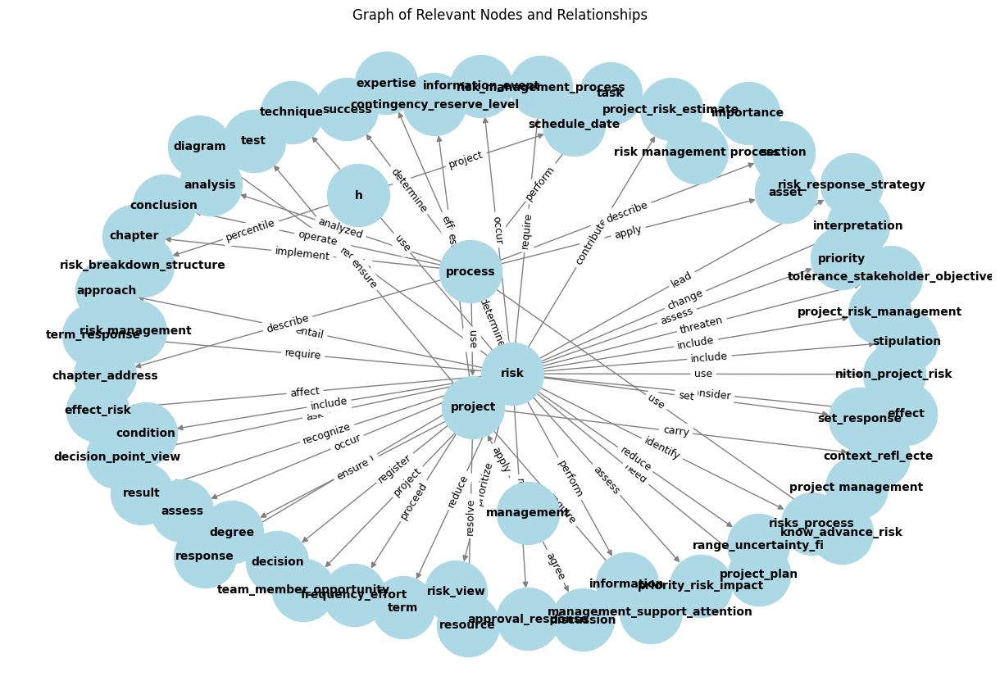

Step 3: Retrieving relevant documents related to nodes from Chroma DB...
Retrieved relevant documents and metadata:
  Chunk 1: Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES These categories of to... (truncated)
  Page: 60, Chapter: Chapter 8
  Chunk 2: Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES The Plan Risk Response... (truncated)
  Page: 55, Chapter: Chapter 8
  Chunk 3: Practice Standard for Project Risk Management 3 CHAPTER 3 INTRODUCTION TO PROJECT RISK MANAGEMENT PR... (truncated)
  Page: 28, Chapter: Chapter 3
  Chunk 4: Practice Standard for Project Risk Management 8 CHAPTER 8 PLAN RISK RESPONSES The strategic de nitio... (truncated)
  Page: 61, Chapter: Chapter 8
  Chunk 5: The provision for risk management resources speci ed within the risk management plan should be appro... (truncated)
  Page: 34, Chapter: Chapter 4


Step 4: Calculating semantic similarity between expanded query and retrieved chunks...
Seman

In [16]:
# Test the function with a sample query
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response_with_logging_and_plot(
    query="Explain the importance of risk management processes in project management."
)

# Print the generated response for verification
print("Generated Response:", response)

In [22]:
import networkx as nx
import plotly.graph_objects as go

def create_animation_step_by_step(query, knowledge_graph, entities_df):
    # Initialize the graph and variables for tracking steps
    G = nx.Graph()
    visited_nodes = set()
    frames = []

    # Function to create a frame for the animation
    def add_frame(G, title):
        pos = nx.spring_layout(G)
        edge_x = []
        edge_y = []
        for edge in G.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=1, color='#888'),
            hoverinfo='none',
            mode='lines')

        node_x = []
        node_y = []
        node_text = []
        for node in G.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=10,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        frames.append(go.Frame(data=[edge_trace, node_trace], name=title))

    # Start the traversal
    print("Starting graph traversal with nodes found in the query:")
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower() and entity not in visited_nodes:
            print(f"Initial node found: {entity}")
            G.add_node(entity)
            visited_nodes.add(entity)

            # Add neighbors and plot each step
            neighbors = list(knowledge_graph.neighbors(entity))
            for neighbor in neighbors:
                if neighbor not in visited_nodes:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    print(f"  {entity} --[{relation}]--> {neighbor}")
                    G.add_node(neighbor)
                    G.add_edge(entity, neighbor, label=relation)
                    visited_nodes.add(neighbor)

                    # Create a frame for this step
                    add_frame(G, f"Step: {entity} to {neighbor}")

            # Traverse deeper into the graph
            next_layer = neighbors
            while next_layer:
                current_layer = next_layer
                next_layer = []
                for current_node in current_layer:
                    deeper_neighbors = list(knowledge_graph.neighbors(current_node))
                    for deeper_neighbor in deeper_neighbors:
                        if deeper_neighbor not in visited_nodes:
                            relation = knowledge_graph[current_node][deeper_neighbor]['relation']
                            print(f"  {current_node} --[{relation}]--> {deeper_neighbor}")
                            G.add_node(deeper_neighbor)
                            G.add_edge(current_node, deeper_neighbor, label=relation)
                            visited_nodes.add(deeper_neighbor)
                            next_layer.append(deeper_neighbor)

                            # Create a frame for this step
                            add_frame(G, f"Step: {current_node} to {deeper_neighbor}")

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data,
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[dict(
                type="buttons",
                showactive=False,
                buttons=[dict(label="Play", method="animate", args=[None, {"frame": {"duration": 1000, "redraw": True}}]),
                         dict(label="Pause", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False}}])]
            )]
        ),
        frames=frames
    )

    fig.show()

# Example usage:
create_animation_step_by_step("risk management process", knowledge_graph, entities_df)


Starting graph traversal with nodes found in the query:
Initial node found: risk
  risk --[recognize]--> result
  risk --[remain]--> response
  risk --[reduce]--> term
  risk --[require]--> approval_response
  risk --[use]--> nition_project_risk
  risk --[require]--> risk_management_process
  risk --[use]--> technique
  risk --[consider]--> effect
  risk --[register]--> decision
  risk --[identify]--> risks_process
  risk --[perform]--> information
  risk --[include]--> project_risk_management
  risk --[assess]--> priority
  risk --[require]--> term_response
  risk --[ask]--> decision_point_view
  risk --[assess]--> priority_risk_impact
  risk --[prioritize]--> risk_view
  risk --[contribute]--> project_risk_estimate
  risk --[threaten]--> tolerance_stakeholder_objective
  risk --[set]--> set_response
  risk --[entail]--> approach
  risk --[need]--> project_plan
  risk --[occur]--> information_event
  risk --[require]--> diagram
  risk --[project]--> team_member_opportunity
  risk --[i

In [24]:
create_animation_step_by_step("What are the primary objectives of identifying potential threats to a project?", knowledge_graph, entities_df)

Starting graph traversal with nodes found in the query:
Initial node found: identifying
  identifying --[generate]--> risk_arise
Initial node found: objective
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project
  risk_analysis_process --[perform]--> assess
  project --[carry]--> context_refl_ecte
  project --[establish]--> contingency_reserve_level
  project --[ensure]--> degree
  project --[require]--> management_support_attention
  project --[proceed]--> frequency_effort
  project --[ensure]--> test
  project --[resolve]--> resource
  contingency_reserve_level --[document]--> technique
  technique --[apply]--> risk
  technique --[perform]--> technique_use
  technique --[monitor]--> addition
  technique --[give]--> constraint
  technique --[use]--> decision
  technique --[perform]--> approach
  technique --[perform]--> risk_analysis
  technique --[monitor]--> monitor_control_risks
  risk --[recognize]--> res

In [ ]:
import networkx as nx
import plotly.graph_objects as go

def create_animation_step_by_step(G, title_prefix="Step"):
    frames = []

    # Function to create a frame for the animation
    def add_frame(G, title):
        pos = nx.spring_layout(G)
        edge_x = []
        edge_y = []
        for edge in G.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=1, color='#888'),
            hoverinfo='none',
            mode='lines')

        node_x = []
        node_y = []
        node_text = []
        for node in G.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=10,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        frames.append(go.Frame(data=[edge_trace, node_trace], name=title))

    # Create a frame for each step
    visited_nodes = list(G.nodes())
    for i, node in enumerate(visited_nodes):
        if i < len(visited_nodes) - 1:
            add_frame(G, f"{title_prefix}: {node}")

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[dict(
                type="buttons",
                showactive=False,
                buttons=[dict(label="Play", method="animate", args=[None, {"frame": {"duration": 1000, "redraw": True}}]),
                         dict(label="Pause", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False}}])],
            )],
        ),
        frames=frames
    )

    fig.show()



Generated Response:

generations=[[ChatGeneration(text="I'm happy to help! However, I must point out that the provided context appears to be a collection of relationships between various concepts and terms related to risk management and project planning. There doesn't seem to be any information about Superman in this context.\n\nIf you meant to ask a different question or provide more context, please feel free to do so, and I'll do my best to assist you!", generation_info={'model': 'llama3:8b', 'created_at': '2024-11-04T15:03:41.4759935Z', 'message': {'role': 'assistant', 'content': ''}, 'done_reason': 'stop', 'done': True, 'total_duration': 281958793900, 'load_duration': 7955168000, 'prompt_eval_count': 1786, 'prompt_eval_duration': 256502463000, 'eval_count': 81, 'eval_duration': 17496107000}, message=AIMessage(content="I'm happy to help! However, I must point out that the provided context appears to be a collection of relationships between various concepts and terms related to risk

In [12]:
import networkx as nx
import plotly.graph_objects as go
from IPython.display import display, HTML

# Function to create the animated graph with Play, Pause, and Restart functionality
def create_animation_step_by_step(G, title_prefix="Step"):
    frames = []

    # Function to create a frame for the animation
    def add_frame(G, title):
        pos = nx.spring_layout(G)
        edge_x = []
        edge_y = []
        for edge in G.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=1, color='#888'),
            hoverinfo='none',
            mode='lines')

        node_x = []
        node_y = []
        node_text = []
        for node in G.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=10,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        frames.append(go.Frame(data=[edge_trace, node_trace], name=title))

    # Create frames for each step
    visited_nodes = list(G.nodes())
    for i, node in enumerate(visited_nodes):
        if i < len(visited_nodes) - 1:
            add_frame(G, f"{title_prefix}: {node}")

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": True
                        }]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {
                            "mode": "immediate",
                            "frame": {"duration": 0, "redraw": False}
                        }]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [[None], {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": False
                        }]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Main function for processing the query and generating the response with animation
def graph_rag_response_with_animation(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()

    # Step 2: Expand query with Knowledge Graph relationships and create a graph for plotting
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    G = nx.Graph()

    print("Starting traversal from initial nodes found in the query:")
    
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Initial node found: {entity}")
            relevant_nodes.append(entity)
            G.add_node(entity)
            neighbors = list(knowledge_graph.neighbors(entity))
            
            print(f"Neighbors of {entity}:")
            for neighbor in neighbors:
                relation = knowledge_graph[entity][neighbor]['relation']
                print(f"  {entity} --[{relation}]--> {neighbor}")
                G.add_node(neighbor)
                G.add_edge(entity, neighbor, label=relation)
                expanded_query += f" {relation} {neighbor}"
                expanded_node_embeddings.append(node_embeddings[neighbor])
                relevant_nodes.append(neighbor)
            
            next_layer = neighbors
            while next_layer:
                current_layer = next_layer
                next_layer = []
                for current_node in current_layer:
                    deeper_neighbors = list(knowledge_graph.neighbors(current_node))
                    for deeper_neighbor in deeper_neighbors:
                        if deeper_neighbor not in relevant_nodes:
                            relation = knowledge_graph[current_node][deeper_neighbor]['relation']
                            print(f"  {current_node} --[{relation}]--> {deeper_neighbor}")
                            G.add_node(deeper_neighbor)
                            G.add_edge(current_node, deeper_neighbor, label=relation)
                            expanded_query += f" {relation} {deeper_neighbor}"
                            expanded_node_embeddings.append(node_embeddings[deeper_neighbor])
                            relevant_nodes.append(deeper_neighbor)
                            next_layer.append(deeper_neighbor)

    # Plot the animated graph showing the traversal process
    create_animation_step_by_step(G)

    # Step 3: Retrieve relevant documents and metadata from Chroma DB
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    # Step 4: Calculate semantic similarity between the query and retrieved chunks
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    context = " ".join(retrieved_chunks)

    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]

    response = llm.generate(messages=[messages])
    return response, retrieved_chunks, retrieved_metadata, relevant_nodes

# Example call to display the graph animation and generate response
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response_with_animation(
    "What are the primary objectives of identifying potential threats to a project?",
    similarity_threshold=0.3
)

# Display section for the animated graph
display(HTML("<h2>Animated Graph</h2>"))
# The graph animation will be shown interactively in your notebook or web interface.

# Check if the response is the default fallback message and display only the answer if so
default_message = "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain."

if response == default_message:
    # Display only the response if it is the fallback message
    print(response)
else:
    # Display the response with structured HTML if it's not the fallback message
    display(HTML("<h2>Generated Response</h2>"))
    display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))

    # Optionally, display retrieved chunks and relevant metadata
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        display(HTML(f"""
            <div style='margin-bottom: 15px;'>
                <h3>Chunk {i}</h3>
                <p><strong>Content (truncated):</strong> {chunk[:150]}...</p>
                <p><strong>Page:</strong> {meta.get('page', 'N/A')} | <strong>Chapter:</strong> {meta.get('chapter', 'N/A')}</p>
            </div>
        """))

    # Display relevant nodes used in response generation
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: identifying
Neighbors of identifying:
  identifying --[generate]--> risk_arise
Initial node found: objective
Neighbors of objective:
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project
  risk_analysis_process --[perform]--> assess
  project --[carry]--> context_refl_ecte
  project --[establish]--> contingency_reserve_level
  project --[ensure]--> degree
  project --[require]--> management_support_attention
  project --[proceed]--> frequency_effort
  project --[ensure]--> test
  project --[resolve]--> resource
  contingency_reserve_level --[document]--> technique
  technique --[apply]--> risk
  technique --[perform]--> technique_use
  technique --[monitor]--> addition
  technique --[give]--> constraint
  technique --[use]--> decision
  technique --[perform]--> approach
  technique --[

In [21]:
import networkx as nx
import plotly.graph_objects as go
from IPython.display import display, HTML

# Function to create the animated graph with Play, Pause, and Restart functionality
def create_animation_step_by_step(G, initial_nodes, title_prefix="Step"):
    frames = []

    # Create an initial frame with only the starting nodes
    initial_frame_nodes = initial_nodes
    initial_frame_edges = [(u, v) for u, v in G.edges() if u in initial_nodes or v in initial_nodes]
    initial_frame_G = G.edge_subgraph(initial_frame_edges).copy()

    pos = nx.spring_layout(G)
    edge_x = []
    edge_y = []
    for edge in initial_frame_G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='#888'),
        hoverinfo='none',
        mode='lines')

    node_x = []
    node_y = []
    node_text = []
    for node in initial_frame_G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(node)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        hoverinfo='text',
        text=node_text,
        textposition='top center',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )
        )
    )

    frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: Initial Nodes"))

    # Add frames for each step with incremental nodes and edges
    visited_nodes = list(G.nodes())
    for i, node in enumerate(visited_nodes):
        if i < len(visited_nodes) - 1 and node not in initial_nodes:
            new_edges = [(u, v) for u, v in G.edges() if u == node or v == node]
            G_step = G.edge_subgraph(initial_frame_edges + new_edges).copy()

            edge_x = []
            edge_y = []
            for edge in G_step.edges():
                x0, y0 = pos[edge[0]]
                x1, y1 = pos[edge[1]]
                edge_x.extend([x0, x1, None])
                edge_y.extend([y0, y1, None])

            edge_trace = go.Scatter(
                x=edge_x, y=edge_y,
                line=dict(width=1, color='#888'),
                hoverinfo='none',
                mode='lines')

            node_x = []
            node_y = []
            node_text = []
            for n in G_step.nodes():
                x, y = pos[n]
                node_x.append(x)
                node_y.append(y)
                node_text.append(n)

            node_trace = go.Scatter(
                x=node_x, y=node_y,
                mode='markers+text',
                hoverinfo='text',
                text=node_text,
                textposition='top center',
                marker=dict(
                    showscale=True,
                    colorscale='YlGnBu',
                    size=10,
                    colorbar=dict(
                        thickness=15,
                        title='Node Connections',
                        xanchor='left',
                        titleside='right'
                    )
                )
            )

            frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: {node}"))

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": True
                        }]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {
                            "mode": "immediate",
                            "frame": {"duration": 0, "redraw": False}
                        }]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [None, {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": False
                        }]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Main function for processing the query and generating the response with animation
def graph_rag_response_with_animation(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()

    # Step 2: Expand query with Knowledge Graph relationships and create a graph for plotting
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    G = nx.Graph()

    print("Starting traversal from initial nodes found in the query:")
    initial_nodes = []
    
    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Initial node found: {entity}")
            relevant_nodes.append(entity)
            G.add_node(entity)
            initial_nodes.append(entity)
            if len(initial_nodes) >= 2:  # Limit the initial number of nodes
                break

    for node in initial_nodes:
        neighbors = list(knowledge_graph.neighbors(node))
        print(f"Neighbors of {node}:")
        for neighbor in neighbors:
            relation = knowledge_graph[node][neighbor]['relation']
            print(f"  {node} --[{relation}]--> {neighbor}")
            G.add_node(neighbor)
            G.add_edge(node, neighbor, label=relation)
            expanded_query += f" {relation} {neighbor}"
            expanded_node_embeddings.append(node_embeddings[neighbor])
            relevant_nodes.append(neighbor)

    # Plot the animated graph starting with initial nodes
    create_animation_step_by_step(G, initial_nodes)

    # Step 3: Retrieve relevant documents and metadata from Chroma DB
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    # Step 4: Calculate semantic similarity between the query and retrieved chunks
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    context = " ".join(retrieved_chunks)

    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]

    response = llm.generate(messages=[messages])
    return response, retrieved_chunks, retrieved_metadata, relevant_nodes

# Example call to display the graph animation and generate response
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response_with_animation(
    "What are the primary objectives of identifying potential threats to a project?",
    similarity_threshold=0.3
)

# Display section for the animated graph
display(HTML("<h2>Animated Graph</h2>"))
# The graph animation will be shown interactively in your notebook or web interface.

# Check if the response is the default fallback message and display only the answer if so
default_message = "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain."

if response == default_message:
    # Display only the response if it is the fallback message
    print(response)
else:
    # Display the response with structured HTML if it's not the fallback message
    display(HTML("<h2>Generated Response</h2>"))
    display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))

    # Optionally, display retrieved chunks and relevant metadata
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        display(HTML(f"""
            <div style='margin-bottom: 15px;'>
                <h3>Chunk {i}</h3>
                <p><strong>Content (truncated):</strong> {chunk[:150]}...</p>
                <p><strong>Page:</strong> {meta.get('page', 'N/A')} | <strong>Chapter:</strong> {meta.get('chapter', 'N/A')}</p>
            </div>
        """))

    # Display relevant nodes used in response generation
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: identifying
Initial node found: objective
Neighbors of identifying:
  identifying --[generate]--> risk_arise
Neighbors of objective:
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project


In [8]:
import networkx as nx
import plotly.graph_objects as go
from IPython.display import display, HTML

# Simplified function to create the animated graph with Play, Pause, and Restart functionality
def create_animation_step_by_step(G, initial_nodes, title_prefix="Step"):
    frames = []
    pos = nx.spring_layout(G)

    # Create the initial frame with only the starting nodes and edges
    initial_frame_G = nx.subgraph(G, initial_nodes).copy()

    def create_traces(graph):
        edge_x = []
        edge_y = []
        for edge in graph.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=1, color='#888'),
            hoverinfo='none',
            mode='lines'
        )

        node_x = []
        node_y = []
        node_text = []
        for node in graph.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=10,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        return edge_trace, node_trace

    # Create the initial frame
    edge_trace, node_trace = create_traces(initial_frame_G)
    frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: Initial Nodes"))

    # Create frames for each step, adding one node at a time
    current_nodes = set(initial_nodes)
    for node in G.nodes():
        if node not in current_nodes:
            current_nodes.add(node)
            new_frame_G = nx.subgraph(G, current_nodes).copy()
            edge_trace, node_trace = create_traces(new_frame_G)
            frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: {node}"))

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": True
                        }]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {
                            "mode": "immediate",
                            "frame": {"duration": 0, "redraw": False}
                        }]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [[None], {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": False
                        }]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Example call to test the animation function
# Replace this with your call to graph_rag_response_with_animation() when integrating
G = nx.Graph()
G.add_edges_from([(1, 2), (2, 3), (3, 4), (4, 5), (5, 6)])
initial_nodes = [1, 2]
create_animation_step_by_step(G, initial_nodes)


In [10]:
import networkx as nx
import plotly.graph_objects as go
from IPython.display import display, HTML

# Revised function to create the animated graph with Play, Pause, and Restart functionality
def create_animation_step_by_step(G, initial_nodes, title_prefix="Step"):
    frames = []
    pos = nx.spring_layout(G)  # Compute layout positions for consistent graph visualization

    # Create the initial frame with only the starting nodes and edges
    initial_frame_G = nx.subgraph(G, initial_nodes).copy()

    def create_traces(graph):
        edge_x = []
        edge_y = []
        for edge in graph.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=2, color='#888'),
            hoverinfo='none',
            mode='lines'
        )

        node_x = []
        node_y = []
        node_text = []
        for node in graph.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=15,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        return edge_trace, node_trace

    # Create the initial frame
    edge_trace, node_trace = create_traces(initial_frame_G)
    frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: Initial Nodes"))

    # Add frames for each step with incremental nodes and edges
    current_nodes = set(initial_nodes)
    for node in G.nodes():
        if node not in current_nodes:
            current_nodes.add(node)
            new_frame_G = nx.subgraph(G, current_nodes).copy()
            edge_trace, node_trace = create_traces(new_frame_G)
            frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: {node}"))

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": True
                        }]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {
                            "mode": "immediate",
                            "frame": {"duration": 0, "redraw": False}
                        }]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [[None], {
                            "frame": {"duration": 1000, "redraw": True},
                            "mode": "immediate",
                            "fromcurrent": False
                        }]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Create a simple test graph to verify the function
G = nx.Graph()
G.add_edges_from([(1, 2), (2, 3), (3, 4), (4, 5), (5, 6)])
initial_nodes = [1, 2]

# Call the function to test the animated graph
create_animation_step_by_step(G, initial_nodes)


In [11]:
import networkx as nx
import plotly.graph_objects as go
import plotly.io as pio

# Set notebook mode for Plotly (specifically for Jupyter environments)
pio.renderers.default = 'notebook'

# Function to create a simple animated graph
def create_simple_animation(G, initial_nodes):
    pos = nx.spring_layout(G)
    frames = []

    def create_traces(nodes):
        edge_x = []
        edge_y = []
        for edge in G.edges():
            if edge[0] in nodes and edge[1] in nodes:
                x0, y0 = pos[edge[0]]
                x1, y1 = pos[edge[1]]
                edge_x.extend([x0, x1, None])
                edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=2, color='#888'), mode='lines')

        node_x = []
        node_y = []
        node_text = []
        for node in nodes:
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y, mode='markers+text', text=node_text,
            marker=dict(size=15, color='lightblue')
        )

        return edge_trace, node_trace

    # Initial frame with only the initial nodes
    current_nodes = set(initial_nodes)
    edge_trace, node_trace = create_traces(current_nodes)
    frames.append(go.Frame(data=[edge_trace, node_trace]))

    # Add frames for each additional node
    for node in G.nodes():
        if node not in current_nodes:
            current_nodes.add(node)
            edge_trace, node_trace = create_traces(current_nodes)
            frames.append(go.Frame(data=[edge_trace, node_trace]))

    fig = go.Figure(
        data=frames[0].data,
        layout=go.Layout(
            title="Simple Graph Animation",
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {"frame": {"duration": 1000, "redraw": True}, "mode": "immediate"}]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {"mode": "immediate", "frame": {"duration": 0, "redraw": False}}]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [[None], {"frame": {"duration": 1000, "redraw": True}, "mode": "immediate"}]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Create a test graph
G = nx.Graph()
G.add_edges_from([(1, 2), (2, 3), (3, 4), (4, 5)])
initial_nodes = [1, 2]

# Call the function to test the animation
create_simple_animation(G, initial_nodes)


# GraphRAG  raisoning model

In [8]:
import networkx as nx
import plotly.graph_objects as go
from IPython.display import display, HTML

# Function to create the animated graph with Play, Pause, and Restart functionality
def create_animation_step_by_step(G, initial_nodes, title_prefix="Step"):
    frames = []
    pos = nx.spring_layout(G)

    def create_traces(graph):
        edge_x = []
        edge_y = []
        for edge in graph.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=2, color='#888'),
            hoverinfo='none',
            mode='lines'
        )

        node_x = []
        node_y = []
        node_text = []
        for node in graph.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=15,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        return edge_trace, node_trace

    # Create the initial frame
    initial_frame_G = nx.subgraph(G, initial_nodes).copy()
    edge_trace, node_trace = create_traces(initial_frame_G)
    frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: Initial Nodes"))

    # Add frames for each additional node and edge
    current_nodes = set(initial_nodes)
    for node in G.nodes():
        if node not in current_nodes:
            current_nodes.add(node)
            new_frame_G = nx.subgraph(G, current_nodes).copy()
            edge_trace, node_trace = create_traces(new_frame_G)
            frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: {node}"))

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {"frame": {"duration": 1000, "redraw": True}, "mode": "immediate"}]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {"mode": "immediate", "frame": {"duration": 0, "redraw": False}}]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [[None], {"frame": {"duration": 1000, "redraw": True}, "mode": "immediate", "fromcurrent": False}]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Updated function to include graph plotting
def graph_rag_response(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()

    # Step 2: Expand query with Knowledge Graph relationships and create the graph for plotting
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    G = nx.Graph()

    print("Starting traversal from initial nodes found in the query:")
    initial_nodes = []

    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Initial node found: {entity}")
            relevant_nodes.append(entity)
            G.add_node(entity)
            initial_nodes.append(entity)
            if len(initial_nodes) >= 2:  # Limit the number of initial nodes shown
                break

    for node in initial_nodes:
        neighbors = list(knowledge_graph.neighbors(node))
        print(f"Neighbors of {node}:")
        for neighbor in neighbors:
            relation = knowledge_graph[node][neighbor]['relation']
            print(f"  {node} --[{relation}]--> {neighbor}")
            G.add_node(neighbor)
            G.add_edge(node, neighbor, label=relation)
            expanded_query += f" {relation} {neighbor}"
            expanded_node_embeddings.append(node_embeddings[neighbor])
            relevant_nodes.append(neighbor)

    # Plot the animated graph starting with initial nodes
    create_animation_step_by_step(G, initial_nodes)

    # Step 3: Retrieve relevant documents and metadata from Chroma DB
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    # Step 4: Calculate semantic similarity between the query and retrieved chunks
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    context = " ".join(retrieved_chunks)

    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]

    response = llm.generate(messages=[messages])
    return response


In [15]:
# Example query to test the function
query = "What are the primary objectives of identifying potential threats to a project?"

# Run the function and display the output
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(
    query,
    similarity_threshold=0.3
)

# Display the response
if response:
    display(HTML("<h2>Generated Response</h2>"))
    display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))

# Display relevant chunks and metadata (if available)
if retrieved_chunks and retrieved_metadata:
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        display(HTML(f"""
            <div style='margin-bottom: 15px;'>
                <h3>Chunk {i}</h3>
                <p><strong>Content (truncated):</strong> {chunk[:150]}...</p>
                <p><strong>Page:</strong> {meta.get('page', 'N/A')} | <strong>Chapter:</strong> {meta.get('chapter', 'N/A')}</p>
            </div>
        """))

# Display relevant nodes used in response generation (if available)
if relevant_nodes:
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: identifying
Initial node found: objective
Neighbors of identifying:
  identifying --[generate]--> risk_arise
Neighbors of objective:
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project


AttributeError: 'str' object has no attribute 'get'

In [17]:
# Example query to test the function
query = "What are the primary objectives of identifying potential threats to a project?"

# Run the function and display the output
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(
    query,
    similarity_threshold=0.3
)

# Display the response
if response:
    display(HTML("<h2>Generated Response</h2>"))
    display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))

# Display relevant chunks and metadata (if available)
if retrieved_chunks and retrieved_metadata:
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        # Check if meta is a dictionary before accessing its keys
        if isinstance(meta, dict):
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
        else:
            page = 'N/A'
            chapter = 'N/A'
        
        display(HTML(f"""
            <div style='margin-bottom: 15px;'>
                <h3>Chunk {i}</h3>
                <p><strong>Content (truncated):</strong> {chunk[:150]}...</p>
                <p><strong>Page:</strong> {page} | <strong>Chapter:</strong> {chapter}</p>
            </div>
        """))

# Display relevant nodes used in response generation (if available)
if relevant_nodes:
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: identifying
Initial node found: objective
Neighbors of identifying:
  identifying --[generate]--> risk_arise
Neighbors of objective:
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project


TypeError: unhashable type: 'slice'

In [18]:
# Example query to test the function
query = "What are the primary objectives of identifying potential threats to a project?"

# Run the function and display the output
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(
    query,
    similarity_threshold=0.3
)

# Display the response
if response:
    display(HTML("<h2>Generated Response</h2>"))
    display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))

# Display relevant chunks and metadata (if available)
if retrieved_chunks and retrieved_metadata:
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        # Ensure chunk is a string before slicing
        if isinstance(chunk, str):
            truncated_chunk = chunk[:150]
        else:
            truncated_chunk = str(chunk)[:150]  # Convert to string and truncate if not a string
        
        # Check if meta is a dictionary before accessing its keys
        if isinstance(meta, dict):
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
        else:
            page = 'N/A'
            chapter = 'N/A'
        
        display(HTML(f"""
            <div style='margin-bottom: 15px;'>
                <h3>Chunk {i}</h3>
                <p><strong>Content (truncated):</strong> {truncated_chunk}...</p>
                <p><strong>Page:</strong> {page} | <strong>Chapter:</strong> {chapter}</p>
            </div>
        """))

# Display relevant nodes used in response generation (if available)
if relevant_nodes:
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: identifying
Initial node found: objective
Neighbors of identifying:
  identifying --[generate]--> risk_arise
Neighbors of objective:
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project


In [21]:
import networkx as nx
import plotly.graph_objects as go
from IPython.display import display, HTML

# Function to create the animated graph with Play, Pause, and Restart functionality
def create_animation_step_by_step(G, initial_nodes, title_prefix="Step"):
    frames = []
    pos = nx.spring_layout(G)

    def create_traces(graph):
        edge_x = []
        edge_y = []
        for edge in graph.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(
            x=edge_x, y=edge_y,
            line=dict(width=2, color='#888'),
            hoverinfo='none',
            mode='lines'
        )

        node_x = []
        node_y = []
        node_text = []
        for node in graph.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            node_text.append(node)

        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers+text',
            hoverinfo='text',
            text=node_text,
            textposition='top center',
            marker=dict(
                showscale=True,
                colorscale='YlGnBu',
                size=15,
                colorbar=dict(
                    thickness=15,
                    title='Node Connections',
                    xanchor='left',
                    titleside='right'
                )
            )
        )

        return edge_trace, node_trace

    # Create the initial frame
    initial_frame_G = nx.subgraph(G, initial_nodes).copy()
    edge_trace, node_trace = create_traces(initial_frame_G)
    frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: Initial Nodes"))

    # Add frames for each additional node and edge
    current_nodes = set(initial_nodes)
    for node in G.nodes():
        if node not in current_nodes:
            current_nodes.add(node)
            new_frame_G = nx.subgraph(G, current_nodes).copy()
            edge_trace, node_trace = create_traces(new_frame_G)
            frames.append(go.Frame(data=[edge_trace, node_trace], name=f"{title_prefix}: {node}"))

    # Create the figure and add the frames for the animation
    fig = go.Figure(
        data=frames[0].data if frames else [],
        layout=go.Layout(
            title="Step-by-Step Graph Animation",
            showlegend=False,
            updatemenus=[{
                "type": "buttons",
                "showactive": True,
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [None, {"frame": {"duration": 1000, "redraw": True}, "mode": "immediate"}]
                    },
                    {
                        "label": "Pause",
                        "method": "animate",
                        "args": [[None], {"mode": "immediate", "frame": {"duration": 0, "redraw": False}}]
                    },
                    {
                        "label": "Restart",
                        "method": "animate",
                        "args": [[None], {"frame": {"duration": 1000, "redraw": True}, "mode": "immediate", "fromcurrent": False}]
                    }
                ]
            }]
        ),
        frames=frames
    )

    fig.show()

# Updated function to include graph plotting and handle metadata correctly
def graph_rag_response(query, similarity_threshold=0.3):
    # Step 1: Get the query embedding
    query_embedding = model.encode(query, convert_to_tensor=True).numpy()

    # Step 2: Expand query with Knowledge Graph relationships and create the graph for plotting
    expanded_query = query
    expanded_node_embeddings = []
    relevant_nodes = []
    G = nx.Graph()

    print("Starting traversal from initial nodes found in the query:")
    initial_nodes = []

    for entity in entities_df['Concept']:
        if entity.lower() in query.lower():
            print(f"Initial node found: {entity}")
            relevant_nodes.append(entity)
            G.add_node(entity)
            initial_nodes.append(entity)
            if len(initial_nodes) >= 2:  # Limit the number of initial nodes shown
                break

    for node in initial_nodes:
        neighbors = list(knowledge_graph.neighbors(node))
        print(f"Neighbors of {node}:")
        for neighbor in neighbors:
            relation = knowledge_graph[node][neighbor]['relation']
            print(f"  {node} --[{relation}]--> {neighbor}")
            G.add_node(neighbor)
            G.add_edge(node, neighbor, label=relation)
            expanded_query += f" {relation} {neighbor}"
            expanded_node_embeddings.append(node_embeddings[neighbor])
            relevant_nodes.append(neighbor)

    # Plot the animated graph starting with initial nodes
    create_animation_step_by_step(G, initial_nodes)

    # Step 3: Retrieve relevant documents and metadata from Chroma DB
    expanded_query_embedding = model.encode(expanded_query, convert_to_tensor=True, normalize_embeddings=True).numpy()
    combined_query_embedding = expanded_query_embedding

    results = collection.query(
        query_embeddings=[combined_query_embedding.tolist()],
        n_results=5
    )
    
    retrieved_chunks = results['documents'][0]
    retrieved_metadata = results['metadatas'][0]

    # Display relevant chunks and metadata (if available)
    if retrieved_chunks and retrieved_metadata:
        display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
        for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
            # Ensure chunk is a string before slicing
            if isinstance(chunk, str):
                truncated_chunk = chunk[:150]
            else:
                truncated_chunk = str(chunk)[:150]  # Convert to string and truncate if not a string

            # Check if meta is a dictionary before accessing its keys
            if isinstance(meta, dict):
                page = meta.get('page', 'N/A')
                chapter = meta.get('chapter', 'N/A')
            else:
                page = 'N/A'
                chapter = 'N/A'
            
            display(HTML(f"""
                <div style='margin-bottom: 15px;'>
                    <h3>Chunk {i}</h3>
                    <p><strong>Content (truncated):</strong> {truncated_chunk}...</p>
                    <p><strong>Page:</strong> {page} | <strong>Chapter:</strong> {chapter}</p>
                </div>
            """))

    # Step 4: Calculate semantic similarity between the query and retrieved chunks
    retrieved_embeddings = model.encode(retrieved_chunks, convert_to_tensor=True).numpy()
    similarities = cosine_similarity([query_embedding], retrieved_embeddings)[0]

    if max(similarities) < similarity_threshold:
        return "I am a language model that only answers questions about the Practice Standard for Project Risk Management. Please ask questions within that domain.", None, None, None

    context = " ".join(retrieved_chunks)

    enhanced_context = context
    for chunk in retrieved_chunks:
        for entity in entities_df['Concept']:
            if entity in chunk:
                neighbors = list(knowledge_graph.neighbors(entity))
                for neighbor in neighbors:
                    relation = knowledge_graph[entity][neighbor]['relation']
                    enhanced_context += f"\n{entity} is related to {neighbor} via {relation}."

    messages = [
        HumanMessage(content=f"Based on the following context: {enhanced_context}\n\nAnswer the question: {query}")
    ]

    response = llm.generate(messages=[messages])
    return response


In [24]:
from IPython.display import display, HTML

# Example query to test the function
query = "What are the primary objectives of identifying potential threats to a project?"

# Run the function and display the output
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(
    query,
    similarity_threshold=0.3
)

# Display the response text
if response:
    # Check if the response contains a text or a structured response with a message attribute
    if isinstance(response, str):
        # Display the response if it's a plain string
        display(HTML("<h2>Generated Response</h2>"))
        display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))
    elif hasattr(response, 'text'):
        # Display the response if it's an object with a 'text' attribute
        display(HTML("<h2>Generated Response</h2>"))
        display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response.text}</div>"))
    elif hasattr(response, 'message') and hasattr(response.message, 'content'):
        # Display the content of the message if present
        display(HTML("<h2>Generated Response</h2>"))
        display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response.message.content}</div>"))
    else:
        print("No valid response text found.")

# Display relevant chunks and metadata (if available)
if retrieved_chunks and retrieved_metadata:
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        # Ensure chunk is a string before slicing
        if isinstance(chunk, str):
            truncated_chunk = chunk[:150]
        else:
            truncated_chunk = str(chunk)[:150]  # Convert to string and truncate if not a string

        # Check if meta is a dictionary before accessing its keys
        if isinstance(meta, dict):
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
        else:
            page = 'N/A'
            chapter = 'N/A'
        
        

# Display relevant nodes used in response generation (if available)
if relevant_nodes:
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: identifying
Initial node found: objective
Neighbors of identifying:
  identifying --[generate]--> risk_arise
Neighbors of objective:
  objective --[permit]--> risk_priority_term
  objective --[perform]--> risk_analysis_process
  objective --[describe]--> project


No valid response text found.


In [25]:
from IPython.display import display, HTML

# Example query to test the function
query = "What is risk mangement?"

# Run the function and display the output
print("=== Query Processing and Response Generation ===\n")
response, retrieved_chunks, retrieved_metadata, relevant_nodes = graph_rag_response(
    query,
    similarity_threshold=0.3
)

# Display the response text
if response:
    # Check if the response contains a text or a structured response with a message attribute
    if isinstance(response, str):
        # Display the response if it's a plain string
        display(HTML("<h2>Generated Response</h2>"))
        display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response}</div>"))
    elif hasattr(response, 'text'):
        # Display the response if it's an object with a 'text' attribute
        display(HTML("<h2>Generated Response</h2>"))
        display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response.text}</div>"))
    elif hasattr(response, 'message') and hasattr(response.message, 'content'):
        # Display the content of the message if present
        display(HTML("<h2>Generated Response</h2>"))
        display(HTML(f"<div style='font-size: 14px; color: #333; padding: 10px; border: 1px solid #ddd;'>{response.message.content}</div>"))
    else:
        print("No valid response text found.")

# Display relevant chunks and metadata (if available)
if retrieved_chunks and retrieved_metadata:
    display(HTML("<h2>Retrieved Chunks and Metadata</h2>"))
    for i, (chunk, meta) in enumerate(zip(retrieved_chunks, retrieved_metadata), 1):
        # Ensure chunk is a string before slicing
        if isinstance(chunk, str):
            truncated_chunk = chunk[:150]
        else:
            truncated_chunk = str(chunk)[:150]  # Convert to string and truncate if not a string

        # Check if meta is a dictionary before accessing its keys
        if isinstance(meta, dict):
            page = meta.get('page', 'N/A')
            chapter = meta.get('chapter', 'N/A')
        else:
            page = 'N/A'
            chapter = 'N/A'
        
        

# Display relevant nodes used in response generation (if available)
if relevant_nodes:
    display(HTML("<h2>Relevant Nodes</h2>"))
    for node in relevant_nodes:
        display(HTML(f"<div style='padding: 5px 0;'>- {node}</div>"))

display(HTML("<h2>End of Output</h2>"))


=== Query Processing and Response Generation ===

Starting traversal from initial nodes found in the query:
Initial node found: risk
Neighbors of risk:
  risk --[recognize]--> result
  risk --[remain]--> response
  risk --[reduce]--> term
  risk --[require]--> approval_response
  risk --[use]--> nition_project_risk
  risk --[require]--> risk_management_process
  risk --[use]--> technique
  risk --[consider]--> effect
  risk --[register]--> decision
  risk --[identify]--> risks_process
  risk --[perform]--> information
  risk --[include]--> project_risk_management
  risk --[assess]--> priority
  risk --[require]--> term_response
  risk --[ask]--> decision_point_view
  risk --[assess]--> priority_risk_impact
  risk --[prioritize]--> risk_view
  risk --[contribute]--> project_risk_estimate
  risk --[threaten]--> tolerance_stakeholder_objective
  risk --[set]--> set_response
  risk --[entail]--> approach
  risk --[need]--> project_plan
  risk --[occur]--> information_event
  risk --[requir

No valid response text found.
